In [1]:
import pandas as pd
pd.set_option('display.max_columns', None)  # or 1000
pd.set_option('display.max_rows', None)  # or 1000
pd.set_option('display.max_colwidth', None)  # or 199

In [2]:
# We can try customer segmentation on this.

In [3]:
data = pd.read_csv('data.csv')

In [4]:
df = data.copy()
df.shape

(541909, 8)

In [5]:
df.head(10)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
5,536365,22752,SET 7 BABUSHKA NESTING BOXES,2,12/1/2010 8:26,7.65,17850.0,United Kingdom
6,536365,21730,GLASS STAR FROSTED T-LIGHT HOLDER,6,12/1/2010 8:26,4.25,17850.0,United Kingdom
7,536366,22633,HAND WARMER UNION JACK,6,12/1/2010 8:28,1.85,17850.0,United Kingdom
8,536366,22632,HAND WARMER RED POLKA DOT,6,12/1/2010 8:28,1.85,17850.0,United Kingdom
9,536367,84879,ASSORTED COLOUR BIRD ORNAMENT,32,12/1/2010 8:34,1.69,13047.0,United Kingdom


In [6]:
df.dropna(axis = 0, subset = ['CustomerID'], inplace = True)
df.drop_duplicates(inplace = True)

### Data Preprocessing

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 401604 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    401604 non-null  object 
 1   StockCode    401604 non-null  object 
 2   Description  401604 non-null  object 
 3   Quantity     401604 non-null  int64  
 4   InvoiceDate  401604 non-null  object 
 5   UnitPrice    401604 non-null  float64
 6   CustomerID   401604 non-null  float64
 7   Country      401604 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 27.6+ MB


In [8]:
print("Number of unique customers: ",df.CustomerID.nunique())

Number of unique customers:  4372


In [9]:
print("number of transactions in the data: ",df.InvoiceNo.nunique())

number of transactions in the data:  22190


In [10]:
print("number of total stocks involved in the transaction in the data: ",df.StockCode.nunique())

number of total stocks involved in the transaction in the data:  3684


In [11]:
print("total countries in the data set: ",df.Country.nunique())

total countries in the data set:  37


In [12]:
### Adding week COlumn as a feature

In [13]:
from datetime import datetime
df['InvoiceDate'] = df['InvoiceDate'].apply(lambda x : datetime.strptime(x,'%m/%d/%Y %H:%M') )

In [14]:
df['day_of_the_week'] = df['InvoiceDate'].apply(lambda x : x.strftime('%A') )

In [15]:
print("Week days in the data: ",df['day_of_the_week'].unique())

Week days in the data:  ['Wednesday' 'Thursday' 'Friday' 'Sunday' 'Monday' 'Tuesday']


In [16]:
df['bill_amount'] = df['Quantity'] * df['UnitPrice']

In [17]:
df.head(5)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,day_of_the_week,bill_amount
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,Wednesday,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,Wednesday,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,Wednesday,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,Wednesday,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,Wednesday,20.34


In [18]:
# one_hot = pd.get_dummies(df['day_of_the_week'])
# # Drop column B as it is now encoded
# df = df.drop('day_of_the_week',axis = 1)
# # Join the encoded df
# df = df.join(one_hot)

In [19]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,day_of_the_week,bill_amount
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,Wednesday,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,Wednesday,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,Wednesday,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,Wednesday,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,Wednesday,20.34


In [20]:
df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'day_of_the_week', 'bill_amount'],
      dtype='object')

In [21]:
df_cancel = df[df.InvoiceNo.str.contains('C')]
df_cancel = df_cancel.groupby(['CustomerID'])['InvoiceNo'].nunique().reset_index().rename(columns={'InvoiceNo':'cancelled_invoices'})
df_cancel

,CustomerID,cancelled_invoices
0,12346.0,1
1,12352.0,3
2,12359.0,2
3,12362.0,3
4,12365.0,1
5,12375.0,1
6,12379.0,1
7,12380.0,1
8,12381.0,1
9,12383.0,1


## Removing cancelled Invoices

In [22]:
entry_to_remove = [] 
doubtfull_entry = []
df_cleaned = df.copy()
for index, col in df_cleaned.iterrows():
    if (col.Quantity>0) | (col.Description =='Discount'):
        continue
    else:
        similiar_entry = df[(df.CustomerID == col['CustomerID']) & (df.Quantity >0) & (df.StockCode == col['StockCode']) \
                            & (df.InvoiceDate < col['InvoiceDate']) ]
        if similiar_entry.shape[0]==0:
#             df.loc[index,'cancelled_flag'] = True
            doubtfull_entry.append(index)
        elif similiar_entry.shape[0]==1:
            index_val = similiar_entry.index[0]
            # df.loc[index_val,'cancelled_flag'] = True
            entry_to_remove.append(index)
        else:
            #print("similiar_entry muliple ",similiar_entry.shape)
            similiar_multiple = similiar_entry.sort_index(axis=0 ,ascending=False).head(1)
            index_val = similiar_multiple.index[0]
            #df.loc[index_val,'cancelled_flag'] = True
            entry_to_remove.append(index)
            
            

In [23]:
print("entry_to_remove: {}".format(len(entry_to_remove)))
print("doubtfull_entry: {}".format(len(doubtfull_entry)))

entry_to_remove: 7569
doubtfull_entry: 1226


In [24]:
df_cleaned.drop(entry_to_remove,axis = 0, inplace = True)
df_cleaned.drop(doubtfull_entry,axis = 0, inplace = True)

In [25]:
df_cleaned.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,day_of_the_week,bill_amount
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,Wednesday,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,Wednesday,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,Wednesday,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,Wednesday,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,Wednesday,20.34


In [26]:
df_cleaned = df_cleaned[~df_cleaned.InvoiceNo.str.contains('C')]
df_cleaned.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,day_of_the_week,bill_amount
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,Wednesday,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,Wednesday,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,Wednesday,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,Wednesday,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,Wednesday,20.34


In [27]:
df_cleaned.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,day_of_the_week,bill_amount
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,Wednesday,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,Wednesday,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,Wednesday,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,Wednesday,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,Wednesday,20.34


In [32]:
# df_grouped = pd.DataFrame(df_cleaned.groupby(['CustomerID','InvoiceNo','day_of_the_week']))
# df_grouped

In [31]:
df_grouped = df_cleaned.groupby(['CustomerID','InvoiceNo','day_of_the_week']).size().reset_index()
df_grouped

,CustomerID,InvoiceNo,day_of_the_week,0
0,12346.0,541431,Tuesday,1
1,12347.0,537626,Tuesday,31
2,12347.0,542237,Wednesday,29
3,12347.0,549222,Thursday,24
4,12347.0,556201,Thursday,18
5,12347.0,562032,Tuesday,22
6,12347.0,573511,Monday,47
7,12347.0,581180,Wednesday,11
8,12348.0,539318,Thursday,17
9,12348.0,541998,Tuesday,6


In [33]:
one_hot = pd.get_dummies(df_grouped['day_of_the_week'])
# Drop column B as it is now encoded
df_grouped = df_grouped.drop('day_of_the_week',axis = 1)
# Join the encoded df
df_grouped = df_grouped.join(one_hot)

In [34]:
df_grouped.head()

,CustomerID,InvoiceNo,0,Friday,Monday,Sunday,Thursday,Tuesday,Wednesday
0,12346.0,541431,1,0,0,0,0,1,0
1,12347.0,537626,31,0,0,0,0,1,0
2,12347.0,542237,29,0,0,0,0,0,1
3,12347.0,549222,24,0,0,0,1,0,0
4,12347.0,556201,18,0,0,0,1,0,0


In [36]:
df_grouped = df_grouped.groupby('CustomerID').agg({'InvoiceNo':'nunique',
                                                      'Friday':'sum',
                                                      'Sunday':'sum',
                                                      'Thursday':'sum',
                                                      'Tuesday':'sum',
                                                      'Wednesday':'sum'})

In [37]:
df_grouped

,InvoiceNo,Friday,Sunday,Thursday,Tuesday,Wednesday
CustomerID,,,,,,
12346.0,1,0,0,0,1,0
12347.0,7,0,0,2,2,2
12348.0,4,0,1,1,2,0
12349.0,1,0,0,0,0,0
12350.0,1,0,0,0,0,1
12352.0,8,0,0,2,4,2
12353.0,1,0,0,1,0,0
12354.0,1,0,0,1,0,0
12355.0,1,0,0,0,0,0


In [40]:
df_grouped = df_grouped.reset_index()

In [41]:
df_cleaned.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,day_of_the_week,bill_amount
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,Wednesday,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,Wednesday,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,Wednesday,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,Wednesday,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,Wednesday,20.34


In [42]:
df_grouped_V0 = df_cleaned.groupby(['CustomerID']).agg({'Quantity':'sum',
                                                        'bill_amount':'sum'
                                                      }).reset_index()
df_grouped_V0

,CustomerID,Quantity,bill_amount
0,12346.0,74215,77183.600
1,12347.0,2458,4310.000
2,12348.0,2341,1797.240
3,12349.0,631,1757.550
4,12350.0,197,334.400
5,12352.0,536,2506.040
6,12353.0,20,89.000
7,12354.0,530,1079.400
8,12355.0,240,459.400
9,12356.0,1591,2811.430


In [43]:
# df_grouped_v1 = df_cleaned.groupby(['CustomerID','InvoiceNo'])[['Quantity','bill_amount']].sum()
# df_grouped_v1 = df_grouped_v1.groupby(['CustomerID'])[['Quantity','bill_amount']].mean().reset_index().\
#                 rename(columns={'Quantity':'mean_bucket_size','bill_amount':'mean_bill_amount'})

In [44]:
# df_grouped_v1 

In [45]:
df_cancel.head()

,CustomerID,cancelled_invoices
0,12346.0,1
1,12352.0,3
2,12359.0,2
3,12362.0,3
4,12365.0,1


In [46]:
df_grouped.head()

,CustomerID,InvoiceNo,Friday,Sunday,Thursday,Tuesday,Wednesday
0,12346.0,1,0,0,0,1,0
1,12347.0,7,0,0,2,2,2
2,12348.0,4,0,1,1,2,0
3,12349.0,1,0,0,0,0,0
4,12350.0,1,0,0,0,0,1


In [48]:
df_grouped_V0.head()

,CustomerID,Quantity,bill_amount
0,12346.0,74215,77183.60
1,12347.0,2458,4310.00
2,12348.0,2341,1797.24
3,12349.0,631,1757.55
4,12350.0,197,334.40


In [50]:
df_grouped_V0.shape

(4339, 3)

In [51]:
df_data = df_grouped_V0.merge(df_grouped,on='CustomerID',how='inner').merge(df_cancel,on='CustomerID',how='left')

In [52]:
df_data['cancelled_invoices'].fillna(0,inplace=True)

In [53]:
df_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4339 entries, 0 to 4338
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   CustomerID          4339 non-null   float64
 1   Quantity            4339 non-null   int64  
 2   bill_amount         4339 non-null   float64
 3   InvoiceNo           4339 non-null   int64  
 4   Friday              4339 non-null   uint8  
 5   Sunday              4339 non-null   uint8  
 6   Thursday            4339 non-null   uint8  
 7   Tuesday             4339 non-null   uint8  
 8   Wednesday           4339 non-null   uint8  
 9   cancelled_invoices  4339 non-null   float64
dtypes: float64(3), int64(2), uint8(5)
memory usage: 224.6 KB


### Scaling the data

In [55]:
df_data.head()

,CustomerID,Quantity,bill_amount,InvoiceNo,Friday,Sunday,Thursday,Tuesday,Wednesday,cancelled_invoices
0,12346.0,74215,77183.60,1,0,0,0,1,0,1.0
1,12347.0,2458,4310.00,7,0,0,2,2,2,0.0
2,12348.0,2341,1797.24,4,0,1,1,2,0,0.0
3,12349.0,631,1757.55,1,0,0,0,0,0,0.0
4,12350.0,197,334.40,1,0,0,0,0,1,0.0


In [56]:
# standardizing the data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_data.iloc[:,1:]))



In [57]:
df_scaled.head()

,0,1,2,3,4,5,6,7,8
0,14.452940,8.363977,-0.424675,-0.391098,-0.403100,-0.465619,0.169513,-0.434446,0.077461
1,0.250849,0.251779,0.354080,-0.391098,-0.403100,0.536276,0.806877,0.656761,-0.388701
2,0.227692,-0.027938,-0.035297,-0.391098,0.403285,0.035328,0.806877,-0.434446,-0.388701
3,-0.110750,-0.032357,-0.424675,-0.391098,-0.403100,-0.465619,-0.467850,-0.434446,-0.388701
4,-0.196647,-0.190780,-0.424675,-0.391098,-0.403100,-0.465619,-0.467850,0.111158,-0.388701


### Model Building

Text(0, 0.5, 'Inertia')

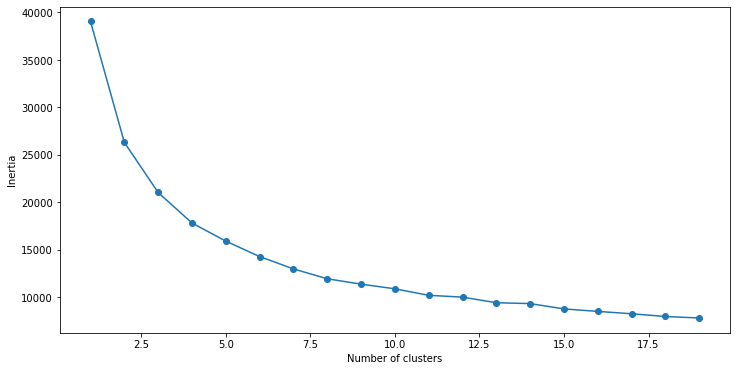

In [58]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
%matplotlib inline
SSE = []
for cluster in range(1,20):
    kmeans = KMeans(n_clusters = cluster, init='k-means++')
    kmeans.fit(df_scaled)
    SSE.append(kmeans.inertia_)

# converting the results into a dataframe and plotting them
frame = pd.DataFrame({'Cluster':range(1,20), 'SSE':SSE})
plt.figure(figsize=(12,6))
plt.plot(frame['Cluster'], frame['SSE'], marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

In [91]:
kmeans = KMeans( n_clusters = 3, init='k-means++')
kmeans.fit(df_scaled)
#pred = kmeans.predict(df_scaled)
cluster_labels = kmeans.labels_

C:\Users\hp\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


In [92]:
df_scaled['cluster'] = cluster_labels

In [93]:
from sklearn.metrics import silhouette_score
silhouette_score(df_scaled, kmeans.fit_predict(df_scaled))

C:\Users\hp\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


0.5957101032320734

In [94]:
df_data['cluster'] = cluster_labels

In [95]:
df_data.head()

,CustomerID,Quantity,bill_amount,InvoiceNo,Friday,Sunday,Thursday,Tuesday,Wednesday,cancelled_invoices,cluster
0,12346.0,74215,77183.60,1,0,0,0,1,0,1.0,1
1,12347.0,2458,4310.00,7,0,0,2,2,2,0.0,1
2,12348.0,2341,1797.24,4,0,1,1,2,0,0.0,1
3,12349.0,631,1757.55,1,0,0,0,0,0,0.0,0
4,12350.0,197,334.40,1,0,0,0,0,1,0.0,0


In [96]:
#df_grouped = df_grouped.drop(columns=['CustomerID'])

In [97]:
frame = df_data.groupby('cluster').describe().T.reset_index()
frame = frame[(frame.level_1 == 'mean')]
frame = frame.reset_index(drop=True).rename(columns={'level_0':'features','level_1':'mean_val'})

In [98]:
frame

cluster,features,mean_val,0,1,2
0,CustomerID,mean,15321.163657,15268.627262,15103.869565
1,Quantity,mean,334.523326,1902.104946,48827.521739
2,bill_amount,mean,547.944008,3266.580356,87599.282174
3,InvoiceNo,mean,1.677577,7.485525,72.434783
4,Friday,mean,0.246802,1.148975,11.739130
5,Sunday,mean,0.284801,0.784077,4.869565
6,Thursday,mean,0.352144,1.655006,15.347826
7,Tuesday,mean,0.174944,1.453559,13.478261
8,Wednesday,mean,0.293454,1.389023,16.173913
9,cancelled_invoices,mean,0.168924,1.696622,15.478261


In [99]:
df_data.cluster.value_counts()

0    2658
1    1658
2      23
Name: cluster, dtype: int64

In [69]:
cluster_big = df_scaled[df_scaled.cluster==2]
cluster_big

,0,1,2,3,4,5,6,7,8,cluster
1,0.250849,0.251779,0.354080,-0.391098,-0.403100,0.536276,0.806877,0.656761,-0.388701,2
2,0.227692,-0.027938,-0.035297,-0.391098,0.403285,0.035328,0.806877,-0.434446,-0.388701,2
3,-0.110750,-0.032357,-0.424675,-0.391098,-0.403100,-0.465619,-0.467850,-0.434446,-0.388701,2
4,-0.196647,-0.190780,-0.424675,-0.391098,-0.403100,-0.465619,-0.467850,0.111158,-0.388701,2
6,-0.231678,-0.218097,-0.424675,-0.391098,-0.403100,0.035328,-0.467850,-0.434446,-0.388701,2
7,-0.130740,-0.107847,-0.424675,-0.391098,-0.403100,0.035328,-0.467850,-0.434446,-0.388701,2
8,-0.188136,-0.176865,-0.424675,-0.391098,-0.403100,-0.465619,-0.467850,-0.434446,-0.388701,2
9,0.079253,0.084960,-0.165090,0.208328,-0.403100,0.035328,0.169513,-0.434446,-0.388701,2
10,0.300328,0.463025,-0.424675,-0.391098,0.403285,-0.465619,-0.467850,-0.434446,-0.388701,2
11,-0.186553,-0.097978,-0.294882,-0.391098,-0.403100,0.035328,0.169513,-0.434446,-0.388701,2


In [70]:
cluster_big.drop(columns=['cluster'],inplace=True)

C:\Users\hp\anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


Text(0, 0.5, 'Inertia')

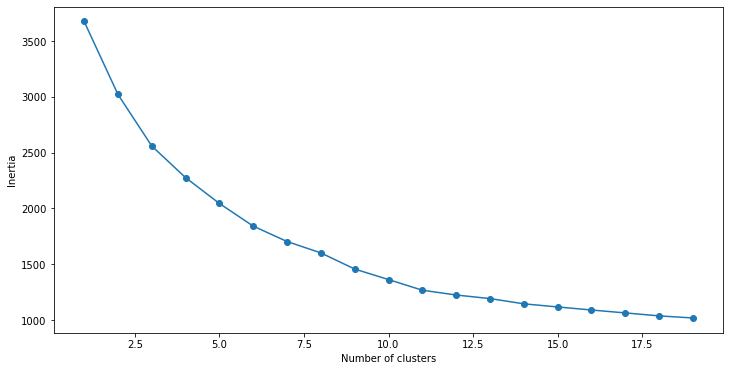

In [71]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
%matplotlib inline
SSE = []
for cluster in range(1,20):
    kmeans = KMeans(n_clusters = cluster, init='k-means++')
    kmeans.fit(cluster_big)
    SSE.append(kmeans.inertia_)

# converting the results into a dataframe and plotting them
frame = pd.DataFrame({'Cluster':range(1,20), 'SSE':SSE})
plt.figure(figsize=(12,6))
plt.plot(frame['Cluster'], frame['SSE'], marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

In [72]:
kmeans = KMeans( n_clusters = 5, init='k-means++')
kmeans.fit(cluster_big)
#pred = kmeans.predict(df_scaled)
cluster_labels = kmeans.labels_

In [73]:
cluster_big['cluster'] = cluster_labels

<ipython-input-73-f476ed4d8031>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_big['cluster'] = cluster_labels


In [74]:
cluster_big

,0,1,2,3,4,5,6,7,8,cluster
1,0.250849,0.251779,0.354080,-0.391098,-0.403100,0.536276,0.806877,0.656761,-0.388701,2
2,0.227692,-0.027938,-0.035297,-0.391098,0.403285,0.035328,0.806877,-0.434446,-0.388701,2
3,-0.110750,-0.032357,-0.424675,-0.391098,-0.403100,-0.465619,-0.467850,-0.434446,-0.388701,0
4,-0.196647,-0.190780,-0.424675,-0.391098,-0.403100,-0.465619,-0.467850,0.111158,-0.388701,0
6,-0.231678,-0.218097,-0.424675,-0.391098,-0.403100,0.035328,-0.467850,-0.434446,-0.388701,0
7,-0.130740,-0.107847,-0.424675,-0.391098,-0.403100,0.035328,-0.467850,-0.434446,-0.388701,0
8,-0.188136,-0.176865,-0.424675,-0.391098,-0.403100,-0.465619,-0.467850,-0.434446,-0.388701,0
9,0.079253,0.084960,-0.165090,0.208328,-0.403100,0.035328,0.169513,-0.434446,-0.388701,4
10,0.300328,0.463025,-0.424675,-0.391098,0.403285,-0.465619,-0.467850,-0.434446,-0.388701,1
11,-0.186553,-0.097978,-0.294882,-0.391098,-0.403100,0.035328,0.169513,-0.434446,-0.388701,0


In [75]:
cluster_big_raw = df_data[df_data.cluster==2]
cluster_big_raw.drop(columns=['cluster'],inplace=True)
cluster_big_raw

C:\Users\hp\anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


,CustomerID,Quantity,bill_amount,InvoiceNo,Friday,Sunday,Thursday,Tuesday,Wednesday,cancelled_invoices
1,12347.0,2458,4310.000,7,0,0,2,2,2,0.0
2,12348.0,2341,1797.240,4,0,1,1,2,0,0.0
3,12349.0,631,1757.550,1,0,0,0,0,0,0.0
4,12350.0,197,334.400,1,0,0,0,0,1,0.0
6,12353.0,20,89.000,1,0,0,1,0,0,0.0
7,12354.0,530,1079.400,1,0,0,1,0,0,0.0
8,12355.0,240,459.400,1,0,0,0,0,0,0.0
9,12356.0,1591,2811.430,3,1,0,1,1,0,0.0
10,12357.0,2708,6207.670,1,0,1,0,0,0,0.0
11,12358.0,248,1168.060,2,0,0,1,1,0,0.0


In [76]:
cluster_big_raw['cluster'] = cluster_labels

<ipython-input-76-6356884093d9>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_big_raw['cluster'] = cluster_labels


In [77]:
frame = cluster_big_raw.groupby('cluster').describe().T.reset_index()
frame = frame[(frame.level_1 == 'mean')]
frame = frame.reset_index(drop=True).rename(columns={'level_0':'features','level_1':'mean_val'})

In [78]:
frame

cluster,features,mean_val,0,1,2,3,4
0,CustomerID,mean,15337.942295,15358.356481,15354.566667,15330.379845,15162.540890
1,Quantity,mean,283.644590,466.157407,993.370833,953.437984,531.051650
2,bill_amount,mean,464.996860,786.770773,1562.511417,1602.999847,912.339040
3,InvoiceNo,mean,1.363279,2.529321,4.425000,4.011628,2.436155
4,Friday,mean,0.000000,0.182099,0.404167,0.319767,1.309900
5,Sunday,mean,0.000000,1.319444,0.125000,0.139535,0.035868
6,Thursday,mean,0.432131,0.308642,0.612500,1.197674,0.324247
7,Tuesday,mean,0.276721,0.194444,2.216667,0.344961,0.223816
8,Wednesday,mean,0.278033,0.231481,0.483333,1.385659,0.199426
9,cancelled_invoices,mean,0.170492,0.277778,0.650000,1.038760,0.328551


In [79]:
cluster_big_raw.cluster.value_counts()

0    1525
4     697
1     648
3     516
2     240
Name: cluster, dtype: int64

In [80]:
from sklearn.metrics import silhouette_score
kmeans.fit(cluster_big)

C:\Users\hp\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


KMeans(n_clusters=5)

In [81]:
silhouette_score(cluster_big, kmeans.fit_predict(cluster_big))

C:\Users\hp\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


0.4910986827048632